In [ ]:
import os
HOME = os.getcwd()

In [ ]:
# Pip install method (recommended)

!pip install ultralytics==8.0.20

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.6/78.2 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="XNLDkGz83sVN1E9iitoB")
project = rf.workspace("joseph-nelson").project("mask-wearing")
dataset = project.version(19).download("yolov8")

/content/datasets
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.0/49.0 KB 6.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 7.9 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=25f78e2c404c9419b7d265c9119c4b41ce9af5943f9904d11ac9ccaad7e2d02c
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pyparsing-3.0.9
  Attempting uninstall: cycler
    Found existing installation: cycler 0.11.0
    Uninstalling cycler-0.11.0:
      Successfully uninstalled cycler-0.11.0


loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Mask-Wearing-19 in yolov8:: 100%|██████████| 3880/3880 [00:01<00:00, 2051.35it/s]


In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data=/content/datasets/Mask-Wearing-19/data.yaml epochs=50 imgsz=800 plots=True

  

[Errno 2] No such file or directory: '{HOME}'
/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/content/datasets/Mask-Wearing-19/data.yaml, epochs=50, patience=50, batch=16, imgsz=800, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, ke

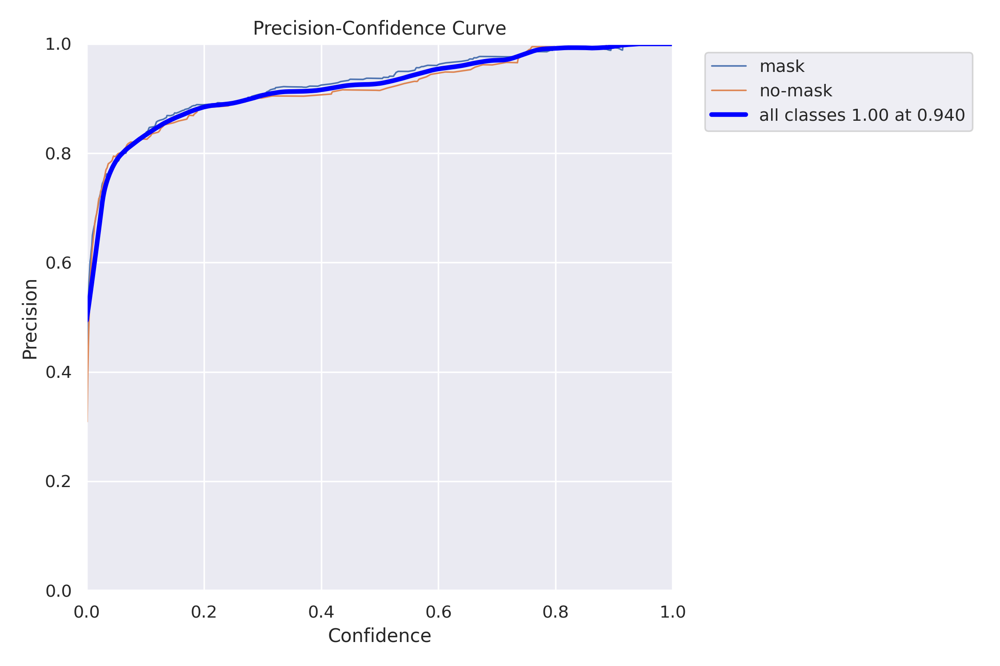

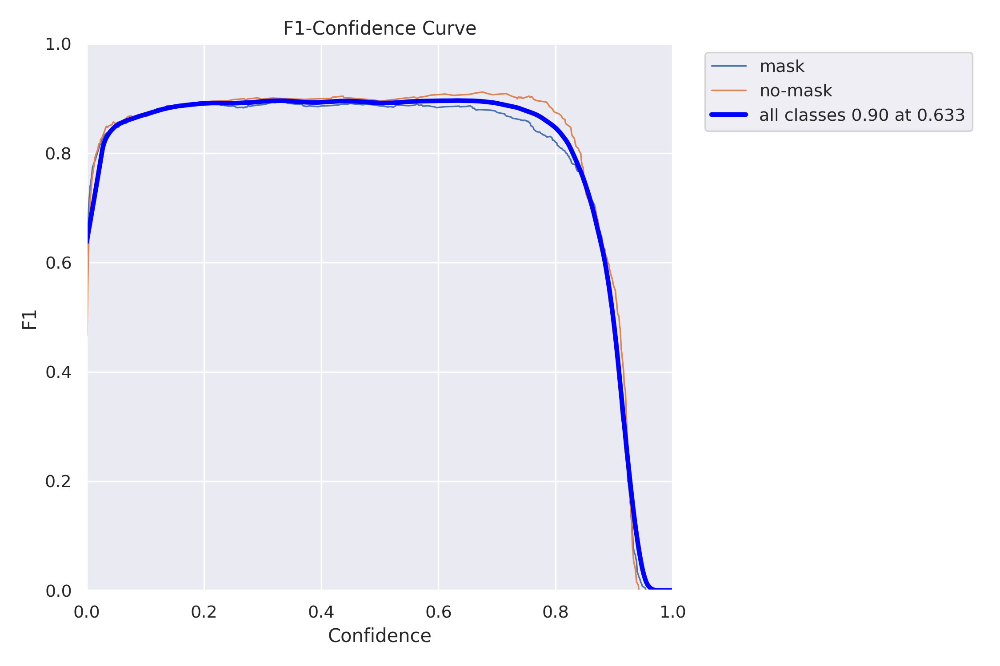

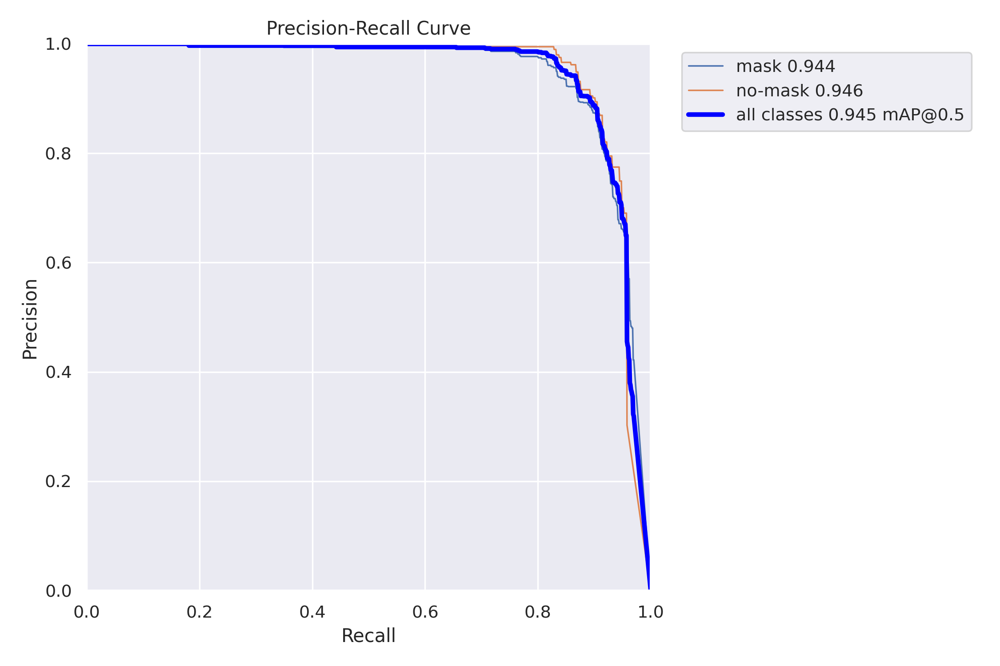

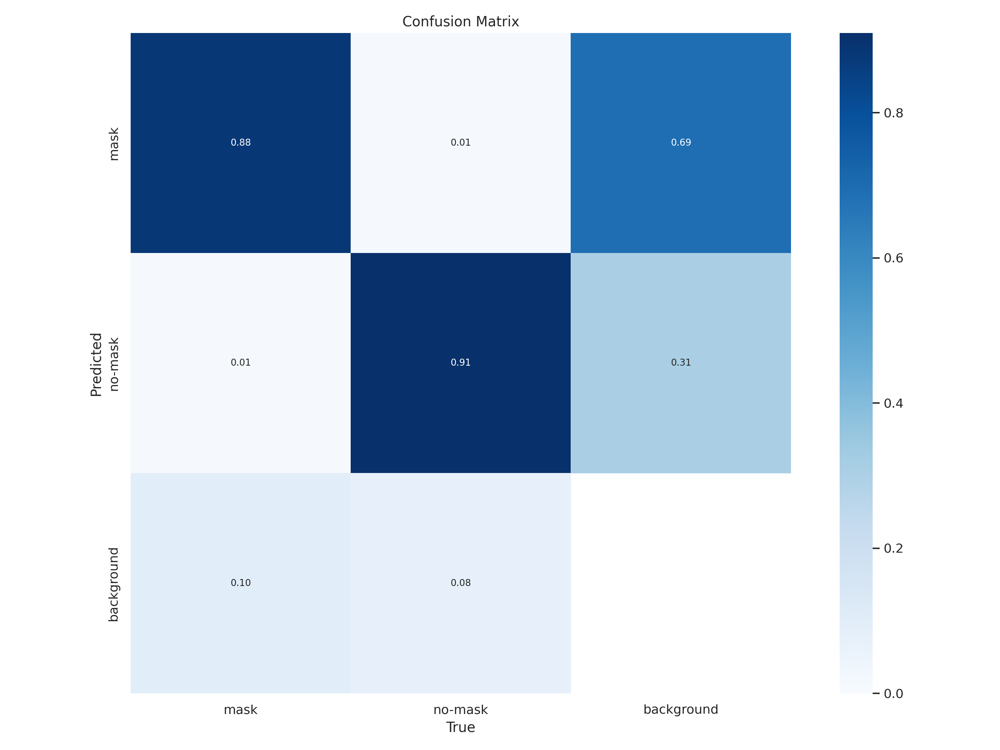

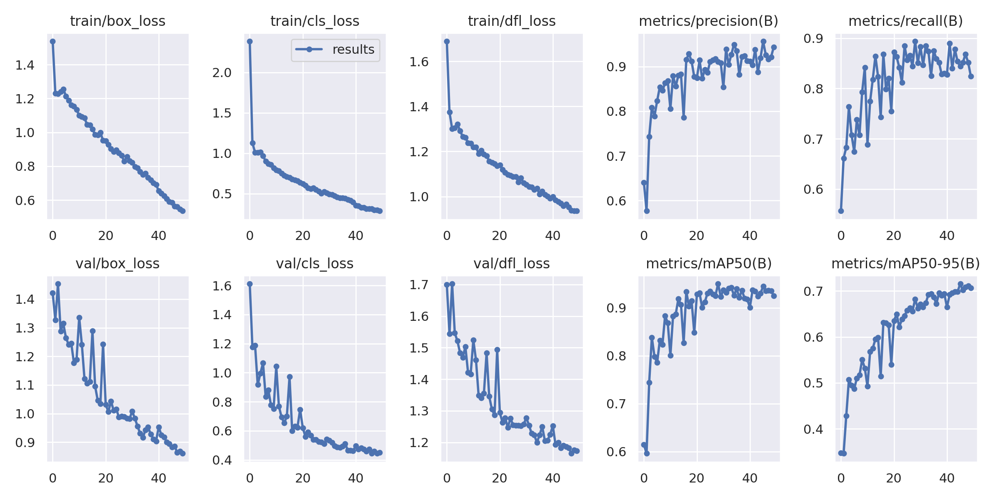

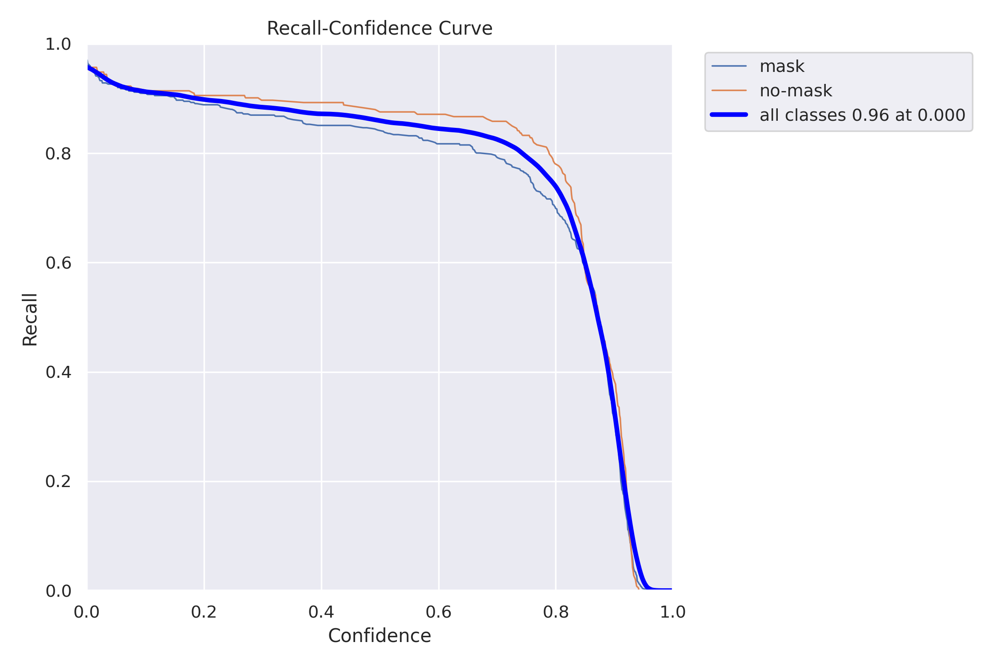

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 100 # max images to print
for imageName in glob.glob('/content/runs/detect/train2/*.png'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName, width=600))
      print("\n")
    i = i + 1

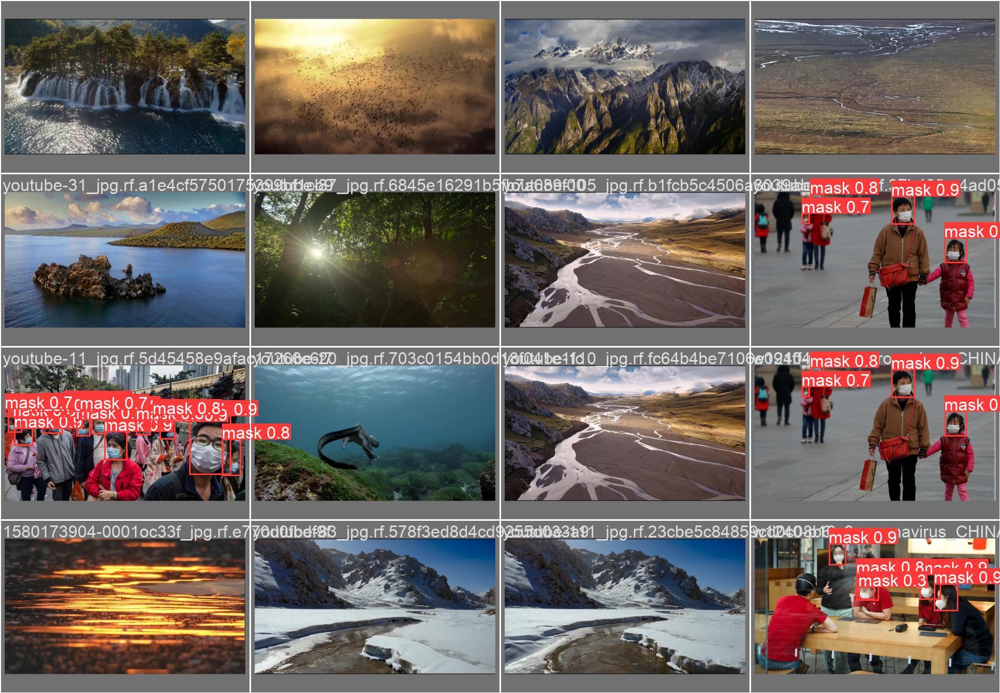

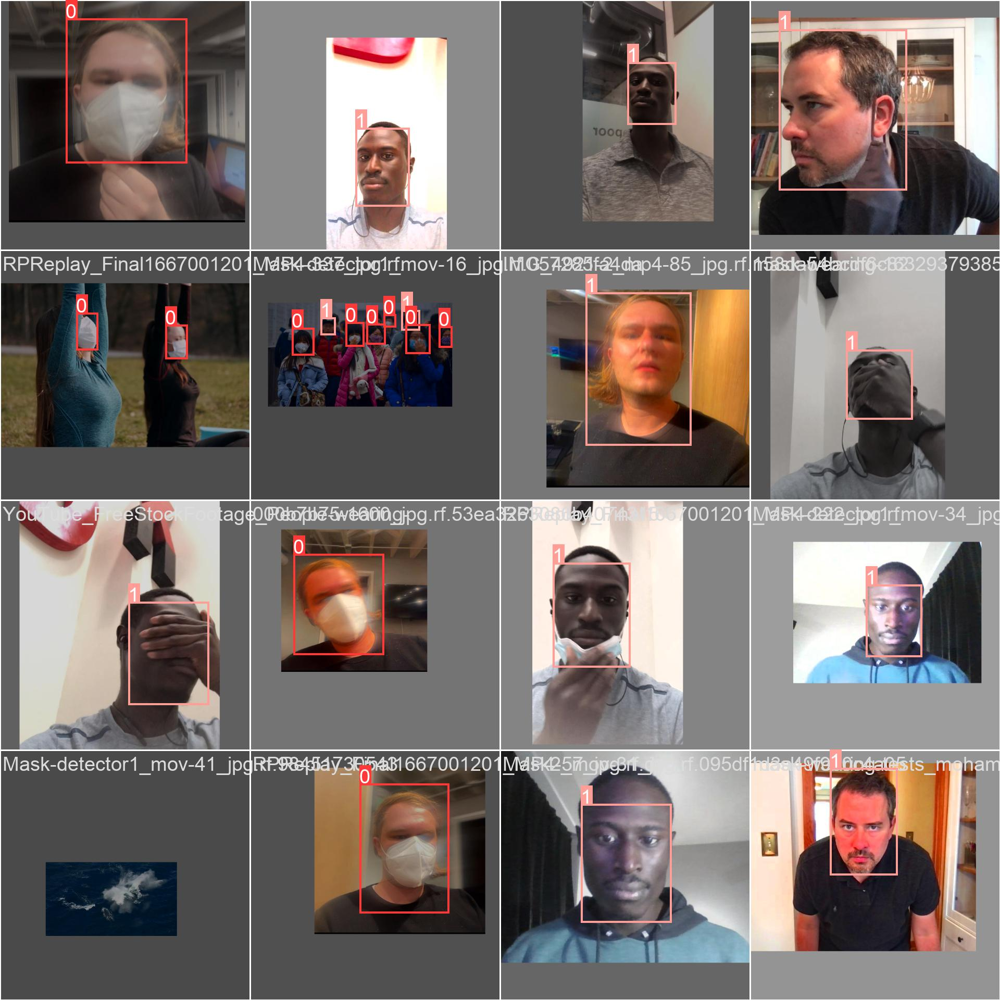

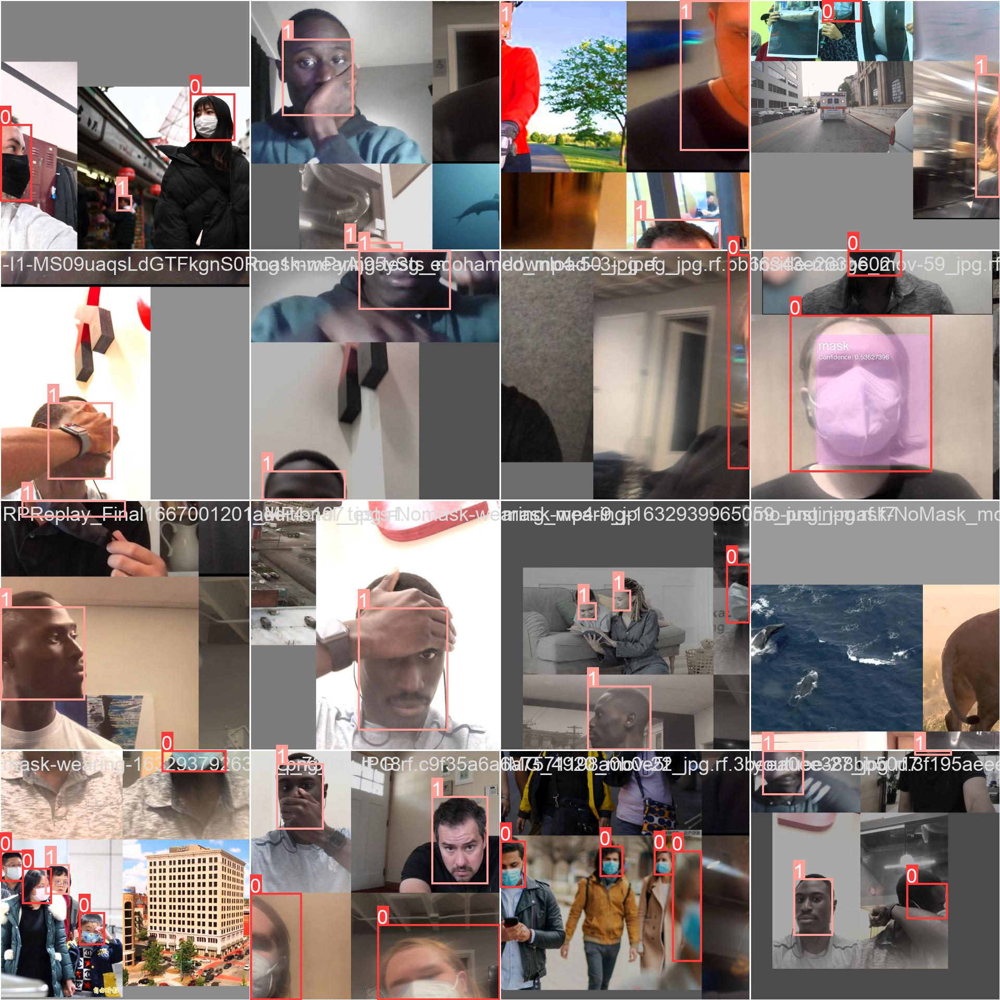

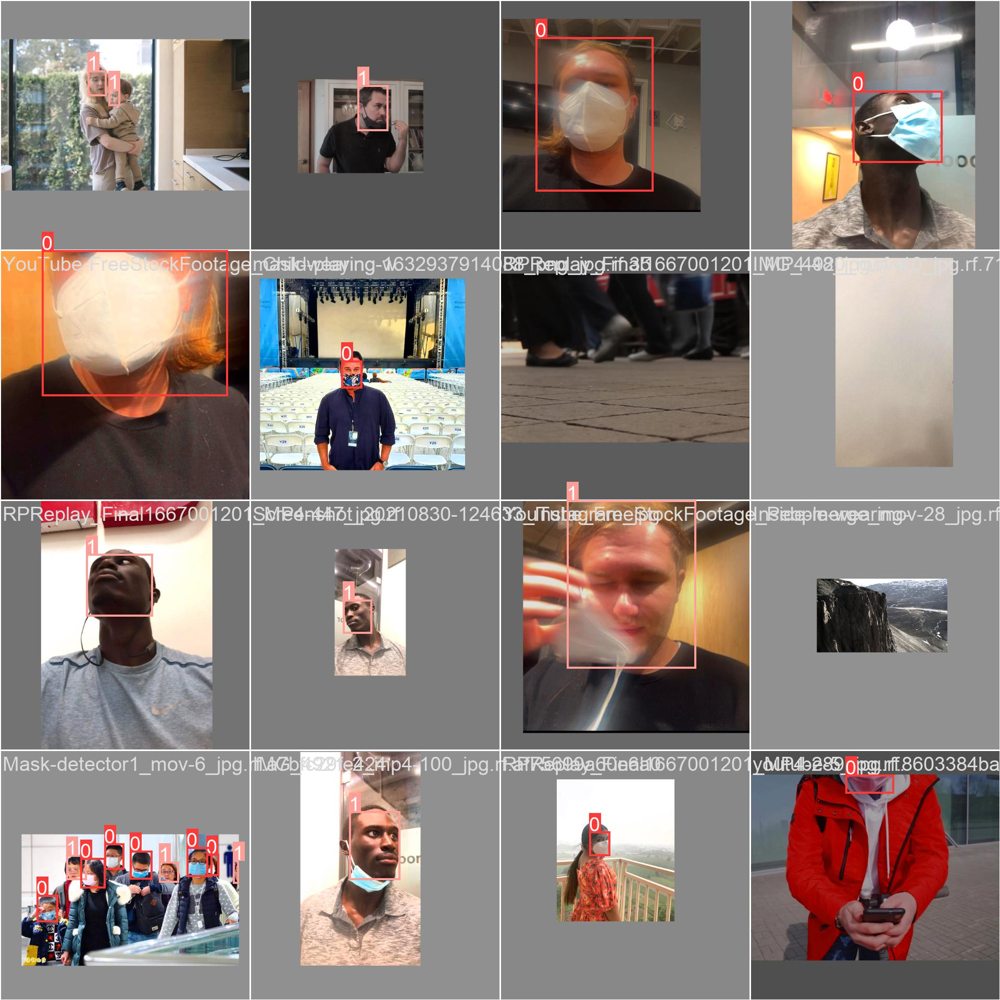

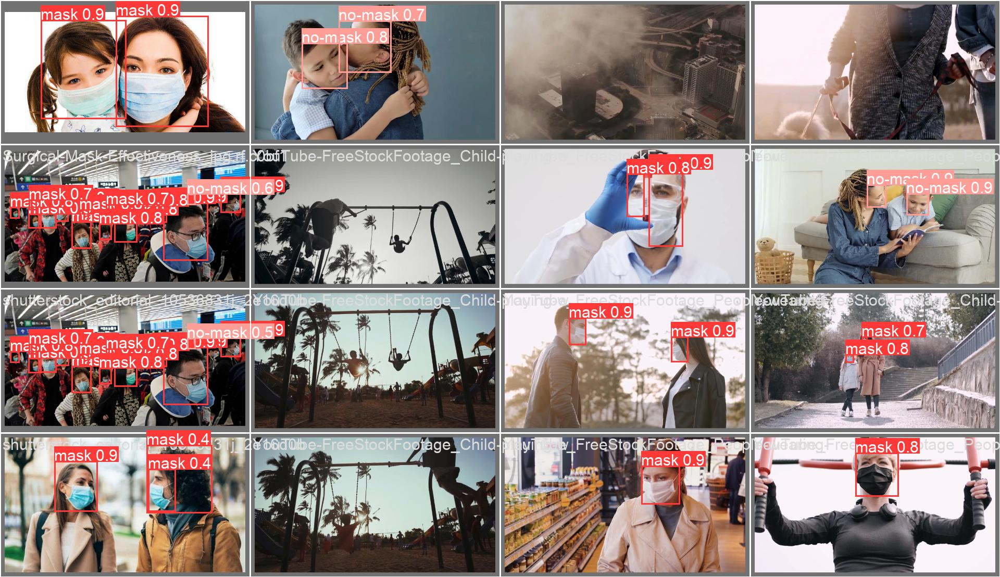

...

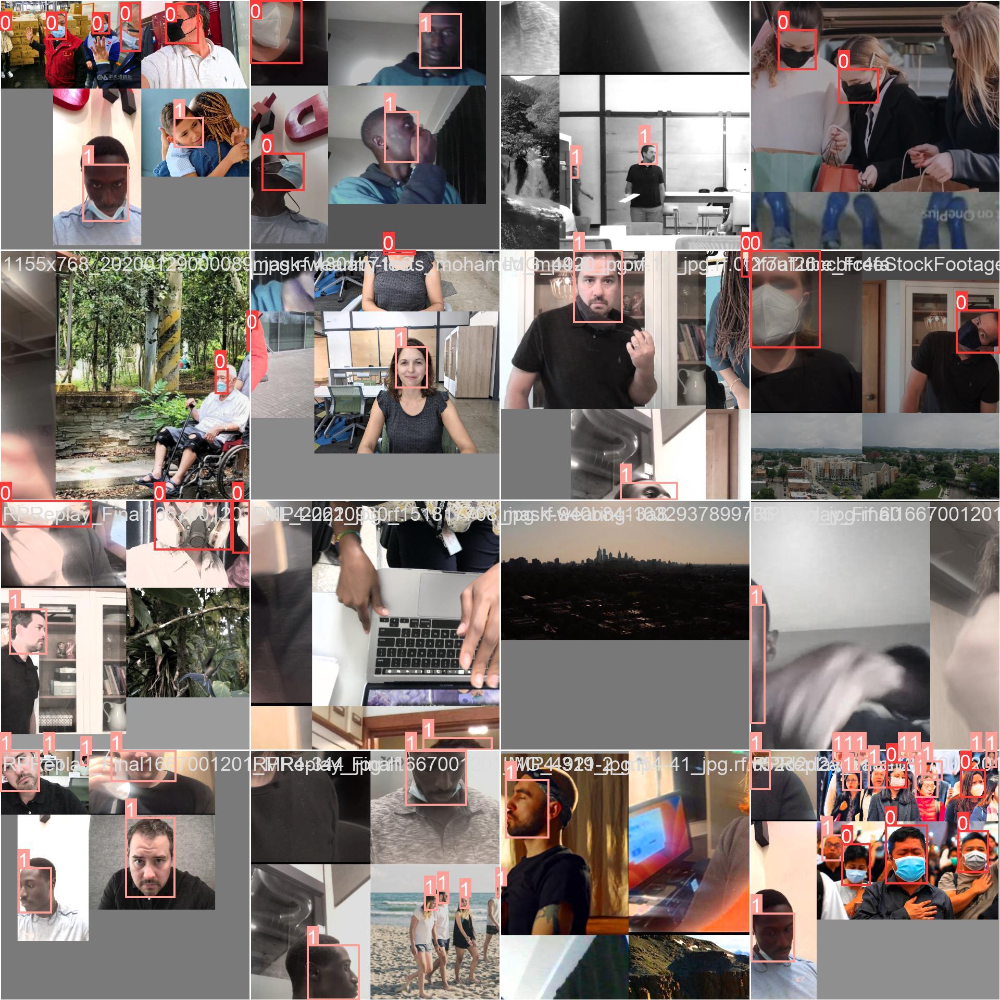

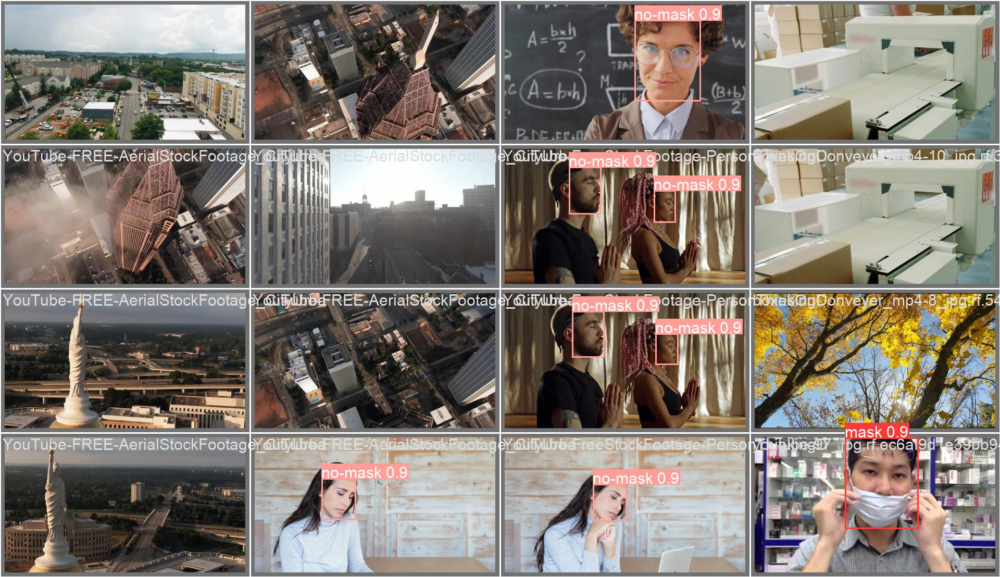

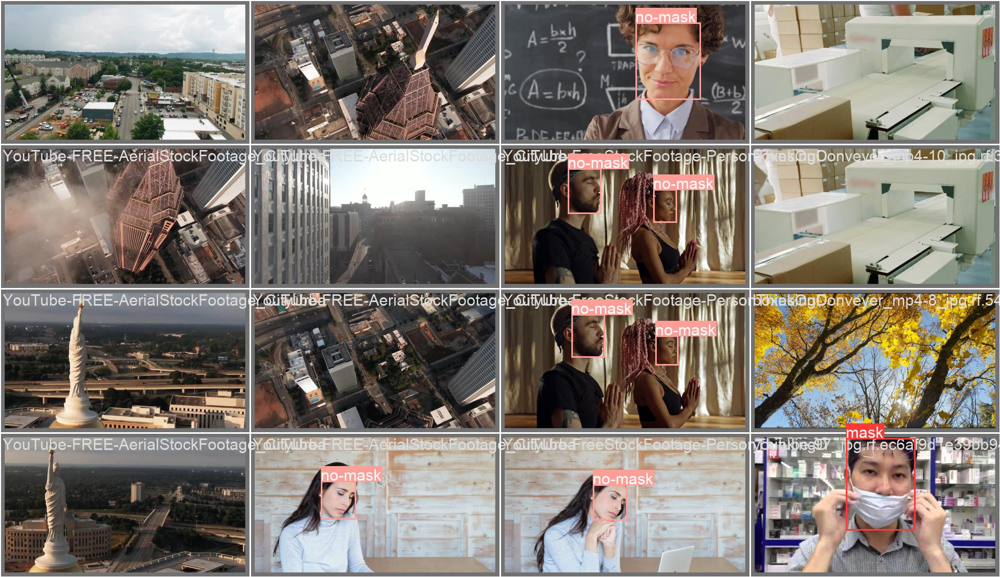

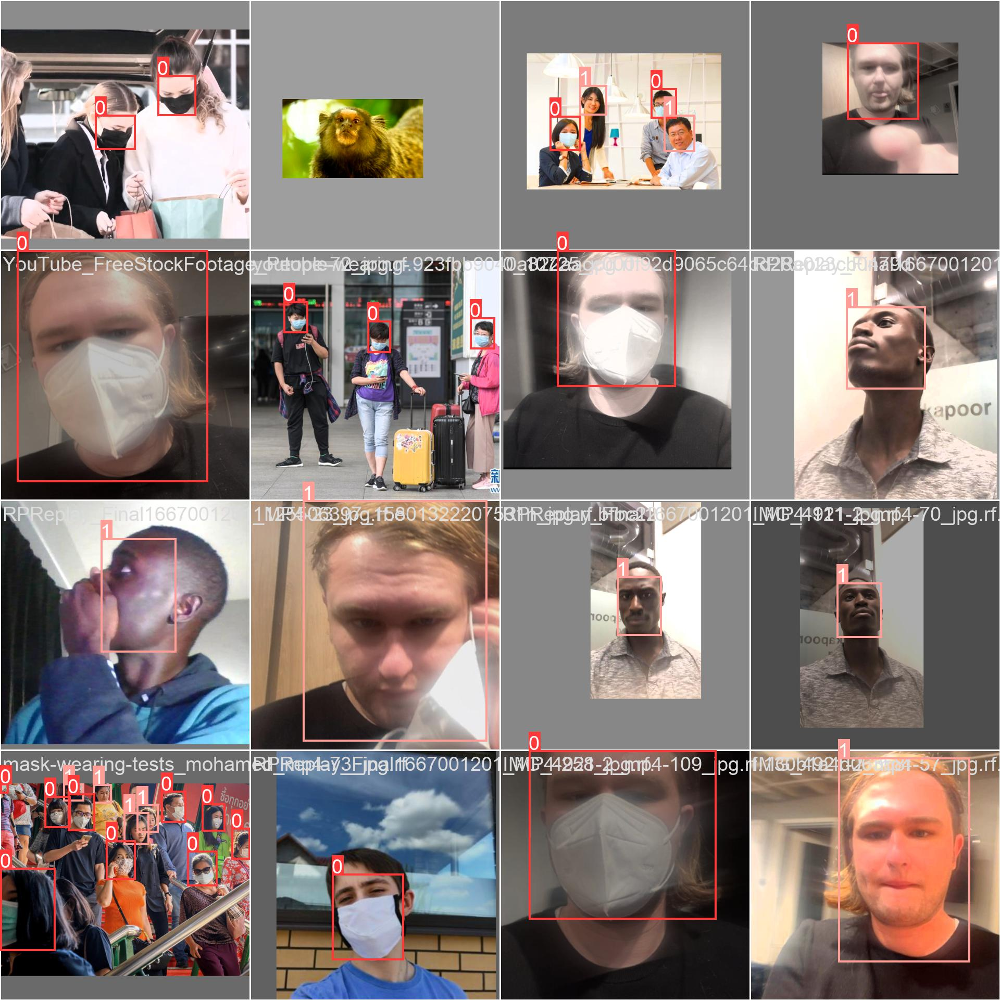

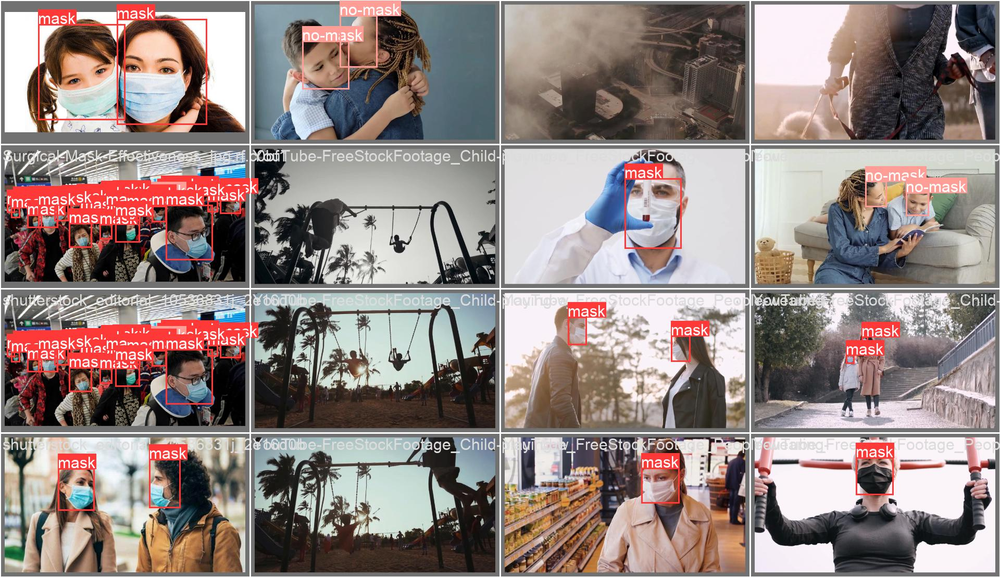

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 100 # max images to print
for imageName in glob.glob('/content/runs/detect/train2/*.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n")
    i = i + 1

In [ ]:
%cd /content/

!yolo task=detect mode=val model=/content/runs/detect/train2/weights/best.pt data=/content/datasets/Mask-Wearing-19/data.yaml

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/Mask-Wearing-19/valid/labels.cache... 368 images, 56 backgrounds, 0 corrupt: 100% 368/368 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 23/23 [00:12<00:00,  1.89it/s]
                   all        368        709      0.915      0.885      0.946      0.716
                  mask        368        476       0.92       0.87      0.946      0.698
               no-mask        368        233      0.909        0.9      0.946      0.733
Speed: 1.1ms pre-process, 10.9ms inference, 0.0ms loss, 1.8ms post-process per image


In [ ]:
%cd /content/
!yolo task=detect mode=predict model=/content/runs/detect/train2/weights/best.pt conf=0.25 source=/content/datasets/Mask-Wearing-19/test/images save=True

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs
image 1/200 /content/datasets/Mask-Wearing-19/test/images/0209-00176-076b1_jpg.rf.68ca9cf32fcefea879d225af4a7c3d44.jpg: 544x800 3 masks, 1 no-mask, 18.8ms
image 2/200 /content/datasets/Mask-Wearing-19/test/images/0450908675_50159485_mutation-virus-chine-inquietude_jpg.rf.bda5fb5e13aac2a13eacab5ee4938218.jpg: 512x800 3 masks, 1 no-mask, 17.3ms
image 3/200 /content/datasets/Mask-Wearing-19/test/images/0_Concern-In-China-As-Mystery-Virus-Spreads_jpg.rf.11f76c39529068ff636fa2242afffa1d.jpg: 448x800 3 masks, 16.8ms
image 4/200 /content/datasets/Mask-Wearing-19/test/images/0_Concern-In-China-As-Mystery-Virus-Spreads_jpg.rf.8817cb47eb5195e35bd6eee4bc773e68.jpg: 448x800 3 masks, 16.0ms
image 5/200 /content/datasets/Mask-Wearing-19/test/images/1224331650_g_400-w_g_jpg.rf.4f6fa6b1a07d7011f5e32cf441b0d8d8.jpg: 768x800 1 ma

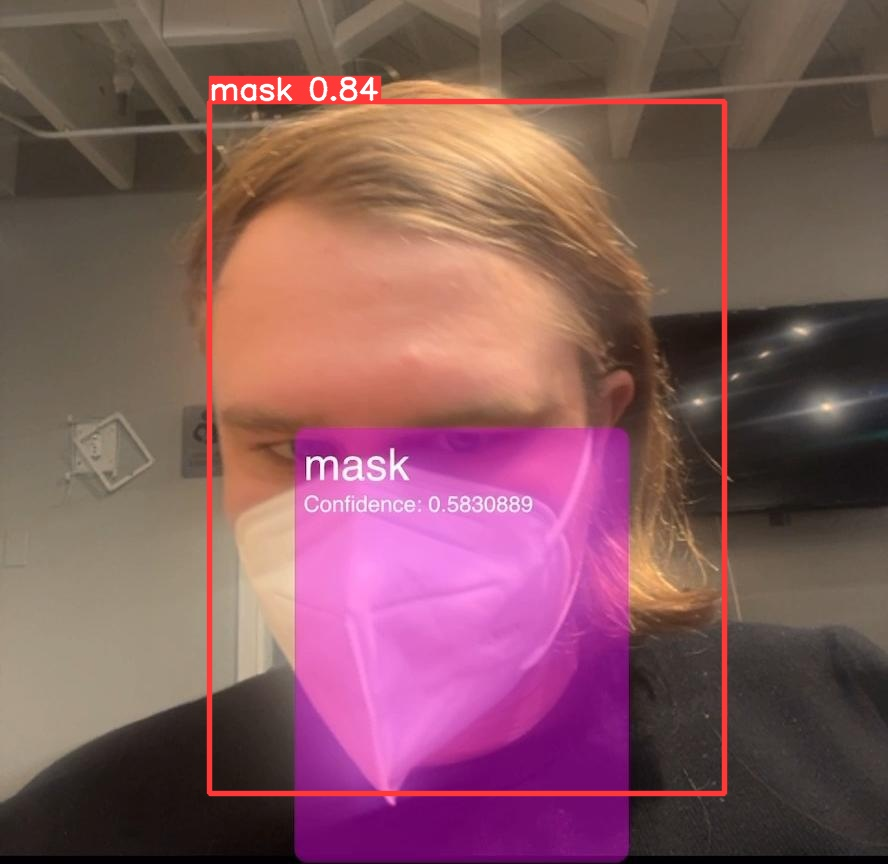

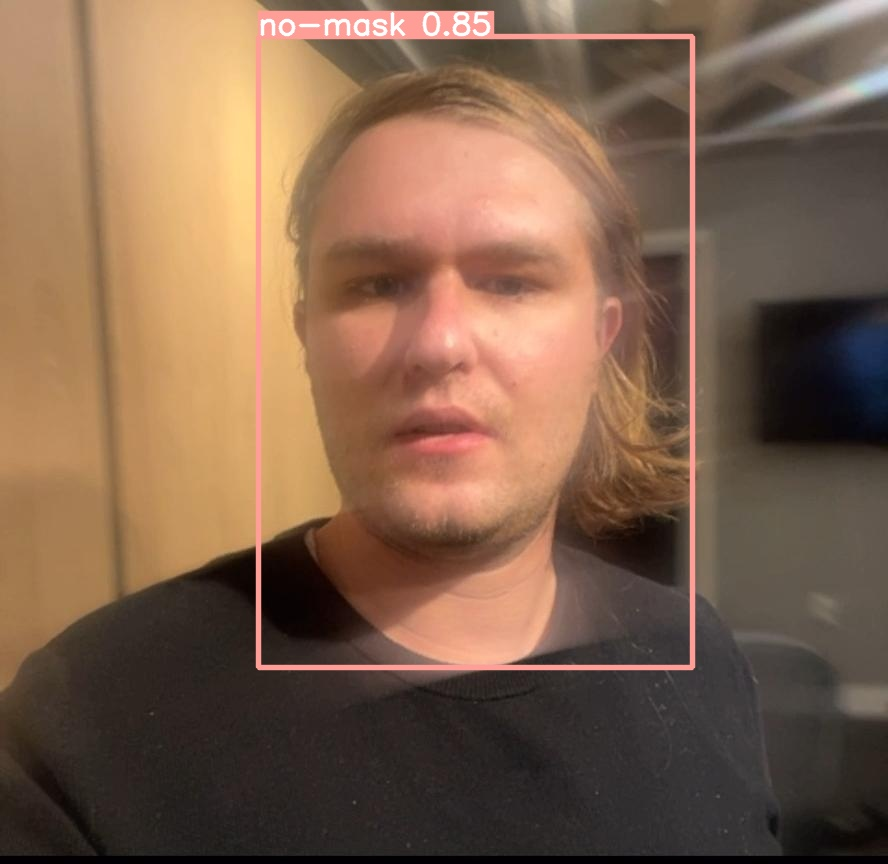

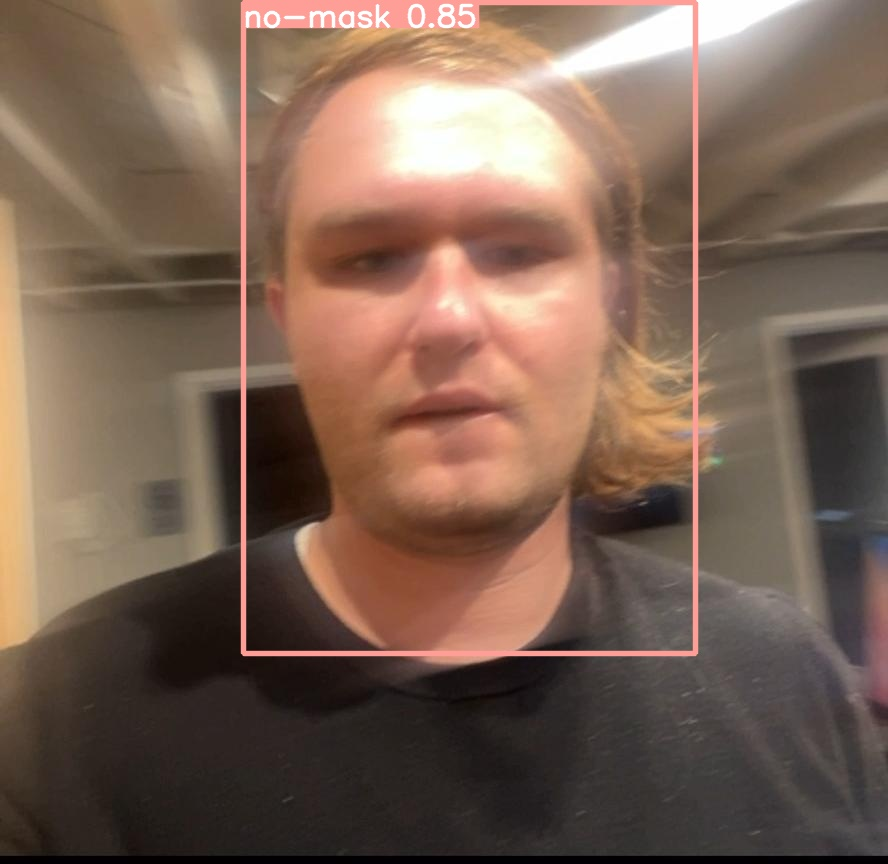

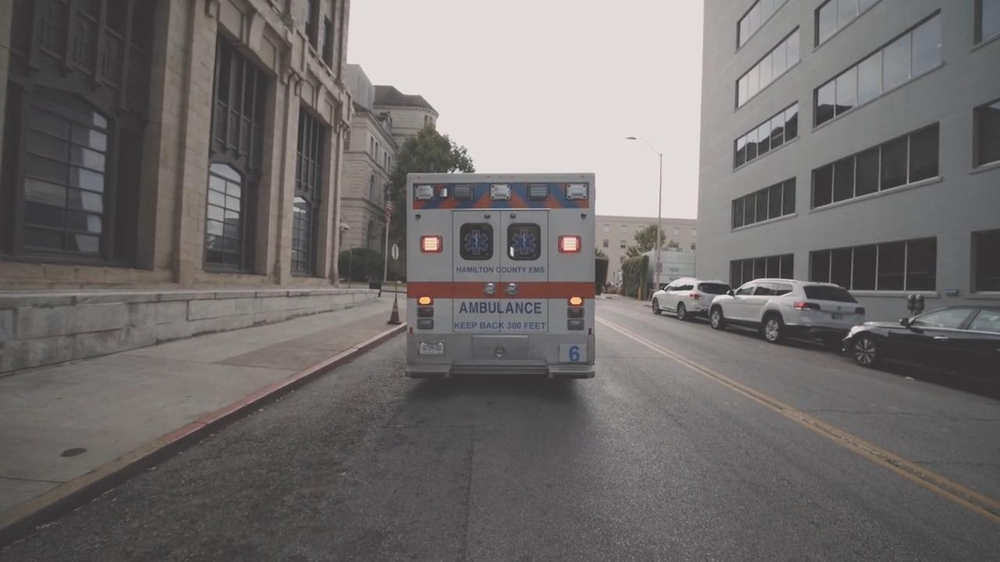

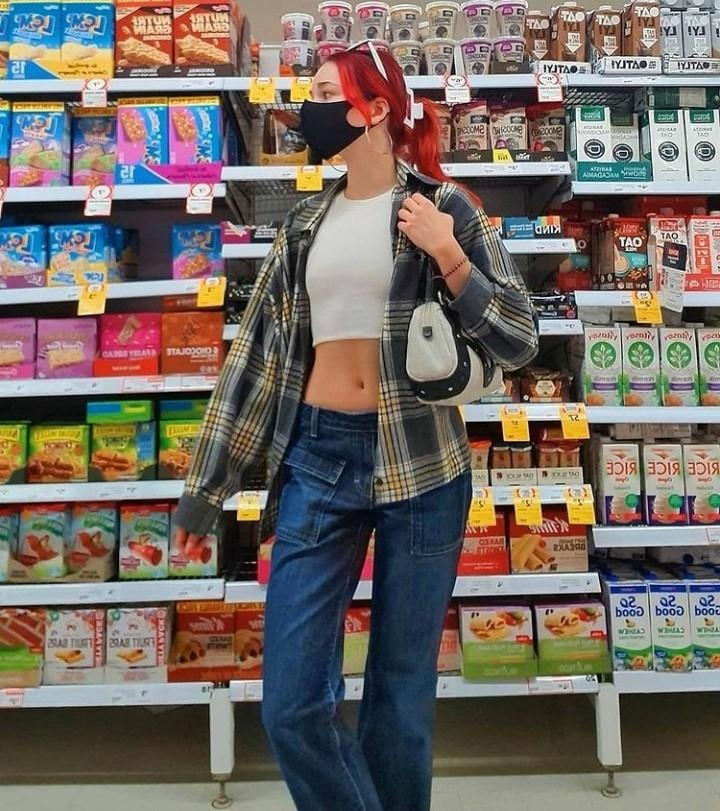

...

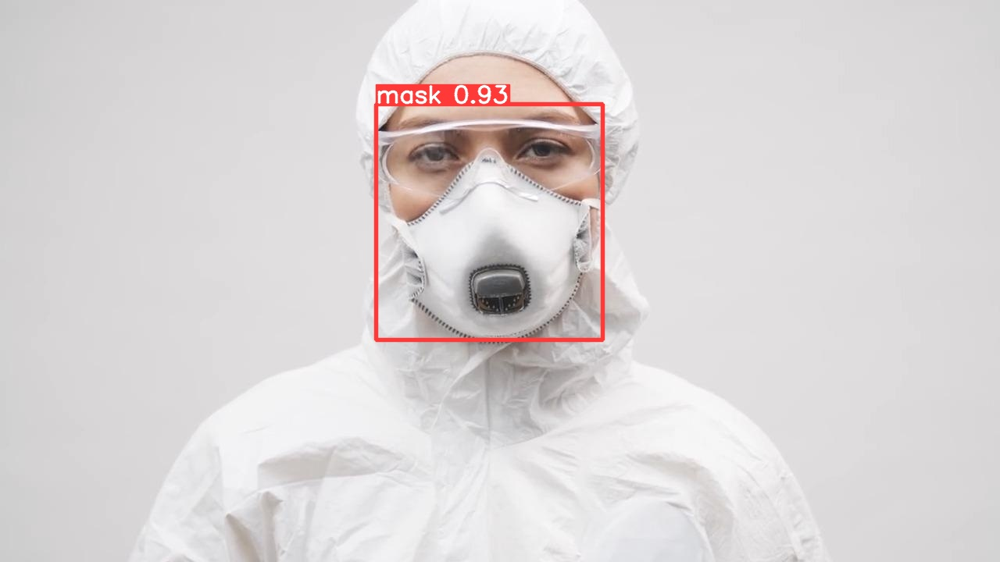

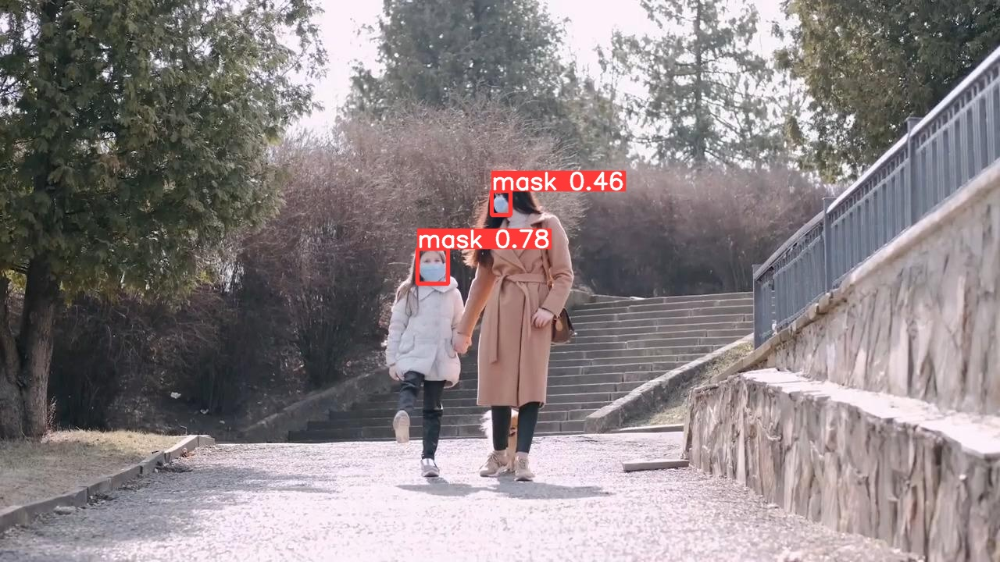

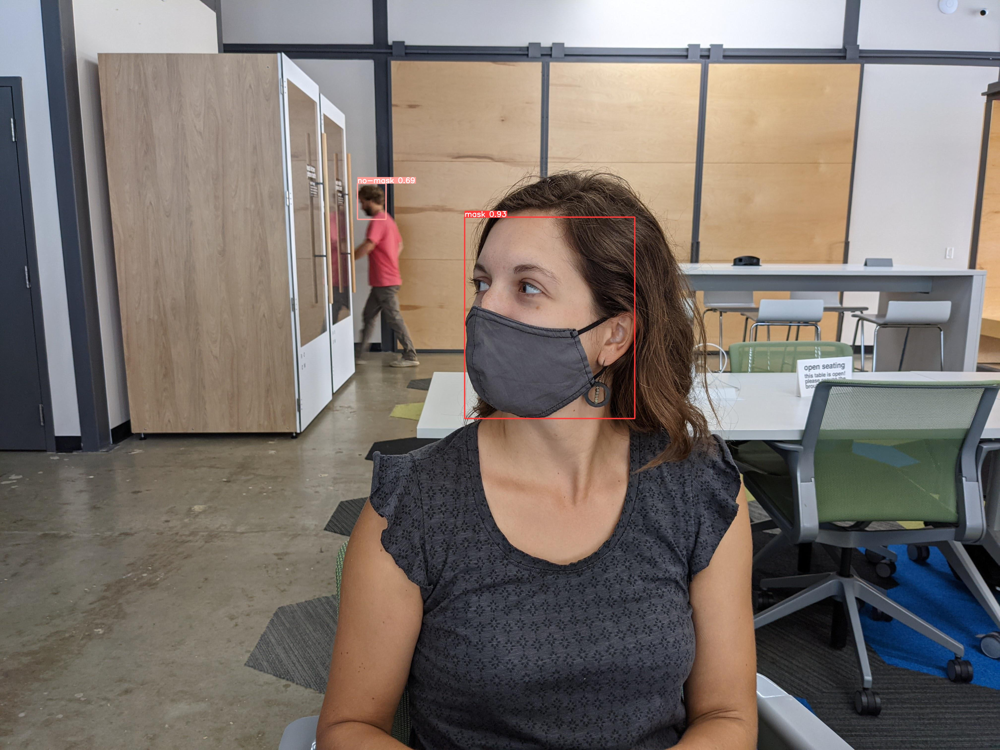

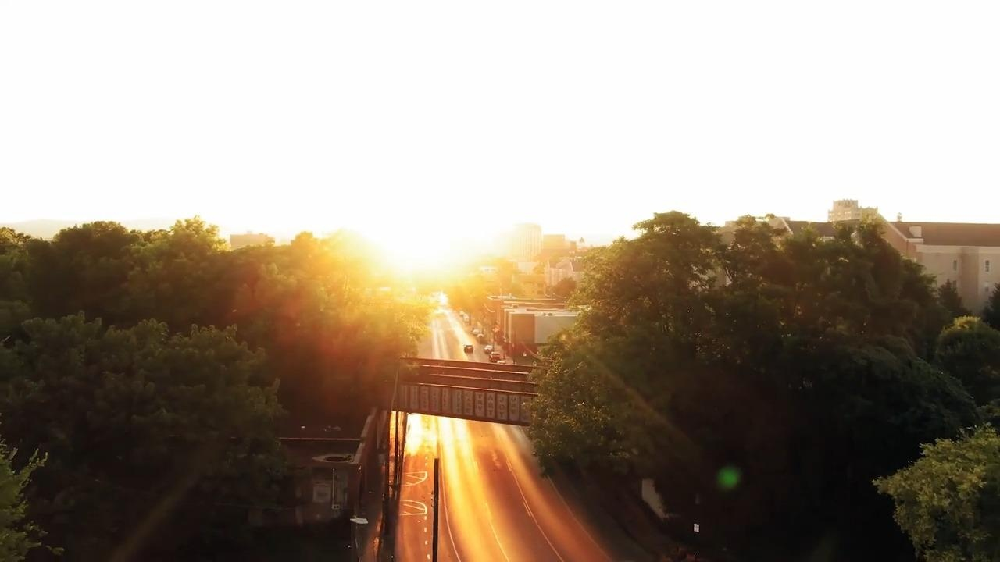

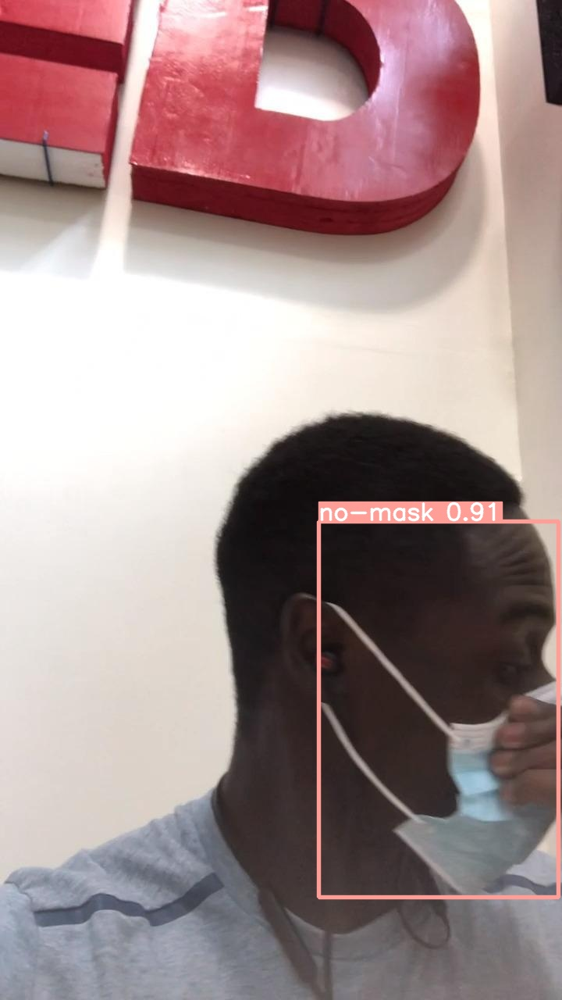

In [ ]:
import glob
from IPython.display import Image, display

i = 0
limit = 20 # max images to print
for imageName in glob.glob('/content/runs/detect/predict3/*.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n")
    i = i + 1